In [1]:
import warnings
warnings.filterwarnings("ignore")

import os
from os.path import join

import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split

import missingno as msno

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import KFold, cross_val_score
import xgboost as xgb
import lightgbm as lgb

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

pd.set_option("display.max_columns",40)

In [2]:
data = pd.read_csv(r".\data\train.csv")
sub = pd.read_csv(r".\data\test.csv")
print('train data dim : {}'.format(data.shape))
print('sub data dim : {}'.format(sub.shape))

train data dim : (15035, 21)
sub data dim : (6468, 20)


## 1. 데이터 살펴보기
pandas의 read_csv 함수를 사용해 데이터를 읽어오고, 각 변수들이 나타내는 의미를 살펴보겠습니다. [데이터셋 설명 페이지](https://www.kaggle.com/c/2019-2nd-ml-month-with-kakr/discussion/83536)

1. ID : 팔린 각각의 집들의 고유한 ID - Unique ID for each home sold (의미없는 변수 지우기)
2. date : 집을 판매한 날짜 - Date of the home sale (이건 요일변수를 일단 뽑아보자)
3. price :  팔린 집 각각의 가격 - Price of each home sold (타겟변수)
4. bedrooms : 침실의 수 - Number of bedrooms (연속형 변수)
5. bathrooms : 침실당 화장실 개수 - Number of bathrooms, where .5 accounts for a room with a toilet but no shower  (연속형 변수)
6. sqft_living : 주거 공간의 평방 피트 - Square footage of the apartments interior living space  (연속형 변수)
7. sqft_lot : 부지의 평방 피트 - Square footage of the land space (연속형 변수)
8. floors : 집의 층 수 - Number of floors  (연속형 변수)
9. waterfront : 집의 전방에 강이 흐르는지 유무 (a.k.a. 리버뷰) - A dummy variable for whether the apartment was overlooking the waterfront or not (범주형 변수)

10. view : 집이 얼마나 좋아 보이는지의 정도(0-4)- An index from 0 to 4 of how good the view of the property was (범주형이지만 순위가 있는 변수)
11. condition : 집의 전반적인 상태(1-5) - An index from 1 to 5 on the condition of the apartment, (범주형이지만 순서가 있는 변수)
12. grade : King County grading 시스템 기준으로 매긴 집의 등급 - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design. (범주형이지만 순서가 있는 변수)
        
13. sqft_above : 지하실을 제외한 평방 피트 - The square footage of the interior housing space that is above ground level(연속)

14. sqft_basement : 지하실의 평방 피트 - The square footage of the interior housing space that is below ground level(연속)

15. yr_built : 집을 지은 년도 - The year the house was initially built (이산형)
16. yr_renovated : 집을 재건축한 년도 - The year of the house’s last renovation(이산형 숫자 데이터)
17. zipcode : 우편번호 - What zipcode area the house is in (범주형 데이터)
18. lat : 위도 (연속)
19. long : 경도 (연속)
20. sqft_living15 : 2015년 기준 주거 공간의 평방 피트(집을 재건축했다면, 변화가 있을 수 있음)(연속형)

- The square footage of interior housing living space for the nearest 15 neighbors
21. sqft_lot15 : 2015년 기준 부지의 평방 피트(집을 재건축했다면, 변화가 있을 수 있음)
- The square footage of the land lots of the nearest 15 neighbors

## 각 변수들을 종류별로 나누기

### 목적변수 
price   
### 설명 변수
__연속형 변수__  
    - "bedrooms", "bathrooms", "sqft_living", "sqft_lot",  "sqft_above", "sqft_basement","yr_built", "yr_renovated","lat","long","sqft_lot15"  
__순위가 없는 범주형__  
    - "waterfront",  "zipcode"  
__순위가 있는 범주형 변수__  
    - "view", "condition","grade",

미분류: date(가공이 더 필요함), "floors"(범주형 같긴한데 EDA를 통해 순위가 있는 범주형인지 아니면 순위가없는 범주형인지 볼것),  

## 2. 간단한 전처리 
각 변수들에 대해 결측 유무를 확인하고, 분포를 확인해보면서 간단하게 전처리를 하겠습니다.
### 결측치 확인
먼저 데이터에 결측치가 있는지를 확인하겠습니다.<br>
missingno 라이브러리의 matrix 함수를 사용하면, 데이터의 결측 상태를 시각화를 통해 살펴볼 수 있습니다.

pd.isnull(data[c]) - c는 data의 컬럼 이름들이 for문을 통해 하나씩 들어온다고 생각하면 됨. 즉 각 데이터 프레임의 결측치를 True, False로 출력한다.  

len(data.loc[pd.isnull(data[c]), c].values) - 위에서 데이터 프레임의 컬럼별 결측치를 한줄로 쭉 뽑아온 것을 loc을 사용해서 인덱싱을 한다. for문을 사용하는 것보다 속도가 굉장히 빠르다. 이렇게 컬럼별 결측치가 있는 데이터만 인덱싱하여서, shape[0]로 결측치 개수를 반환한다

In [3]:
for c in data.columns:
    print('{} : {}'.format(c, data.loc[pd.isnull(data[c]), c].shape[0]))

id : 0
date : 0
price : 0
bedrooms : 0
bathrooms : 0
sqft_living : 0
sqft_lot : 0
floors : 0
waterfront : 0
view : 0
condition : 0
grade : 0
sqft_above : 0
sqft_basement : 0
yr_built : 0
yr_renovated : 0
zipcode : 0
lat : 0
long : 0
sqft_living15 : 0
sqft_lot15 : 0


### id 변수 삭제
- id 변수는 데이터의 번호이지 다른 의미가 없으므로 삭제한다.

In [4]:
del data['id'] # id 컬럼 제거

print(data.shape)
data.head()

(15035, 20)


,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
2,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
3,20140627T000000,257500.0,3,2.25,1715,6819,2.0,0,0,3,7,1715,0,1995,0,98003,47.3097,-122.327,2238,6819
4,20150115T000000,291850.0,3,1.50,1060,9711,1.0,0,0,3,7,1060,0,1963,0,98198,47.4095,-122.315,1650,9711


## 집 가격의 분포

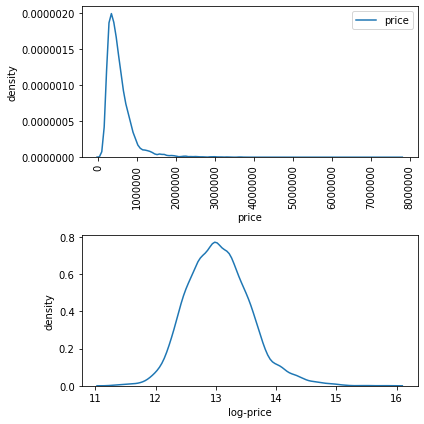

In [5]:
pr=np.log1p(data["price"].values)

plt.figure(figsize=(6,6))
plt.subplot(211)
sns.kdeplot(data["price"])
plt.xlabel("price")
plt.xticks(rotation=90)
plt.ylabel("density")

plt.subplot(212)
sns.kdeplot(pr)
plt.xlabel("log-price")
plt.ylabel("density")

plt.tight_layout()
plt.show()

price의 확률밀도함수를 그려본 결과, 저렴한 가격의 집은 매우 많이 판매되는 반면에 큰 금액의 집은 매우 적게 판매되어 오른쪽으로 치우친 분포를 보이는 것을 알수 있다. price에 log를 취하여 데이터의 편차를 줄여서 왜도와 첨도를 줄여주어서 정규분포에 가깝게 만들어준다. __(주의, 마지막에 제출하기 전에 다시 exp변환을 해주어야한다)__

In [6]:
data["price"]=np.log1p(data["price"].values) # 타겟변수인 price에 로그취한다


### 로그변환이 분포의 치우침을 줄어들게 만드는 이유는?


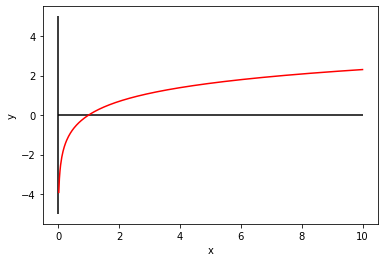

In [7]:
xx=np.linspace(0,10,500)
yy=np.log(xx)

plt.hlines(0,0,10)
plt.vlines(0,-5,5)
plt.plot(xx,yy,c="r")

plt.xlabel("x")
plt.ylabel("y")
plt.show()

로그함수는  
- x구간이 $0<x<1$일때 y의 구간은 (-$\infty$,0)이다. x가 조금만 증가해도 y가 매우 빠르게 증가한다. 
- x구간이 $1<x<\infty$일때는 y의 구간은 $(0,\infty)$ 이다.
- 즉, 로그함수는 x값이 점점 커지면서 로그함수의 기울기가 매우 완만해진다. 
- 로그함수의 이런 특징으로 인해서 하나의 변수 안에서 매우 작은 값과 매우 큰값이 함께 있어서 스케일 차이가 지나치게 크게 나는 경우 혹은 한쪽으로 몰려있는 분포에 로그변환을 취하면 정규분포 모양으로 고르게 분포가 된다.

In [8]:
#data[["yr_built","yr_renovated"]]
data["yr_renovated"].unique() # 0으로 적혀있는 값은 재건축을 하지 않은 집이다.

array([   0, 2002, 1999, 1991, 1978, 2005, 2008, 2003, 1994, 1984, 1954,
       2014, 2011, 1974, 1983, 2013, 1990, 1957, 1977, 1981, 1995, 2000,
       1986, 1992, 2004, 2007, 1987, 2006, 1985, 1971, 1945, 1979, 1997,
       2010, 1969, 1948, 2009, 1970, 2015, 1989, 2001, 1968, 2012, 1963,
       1993, 1962, 1972, 1980, 1998, 1955, 1996, 1950, 1956, 1982, 1988,
       1940, 1946, 1975, 1964, 1958, 1976, 1973, 1967, 1965, 1944],
      dtype=int64)

In [9]:
print(data[data["yr_renovated"]==0].shape[0]) # 재건축 안 함
print(data[data["yr_renovated"]!=0].shape[0]) # 재건축 함


14404
631


              yr_renovated     price
yr_renovated      1.000000  0.129042
price             0.129042  1.000000


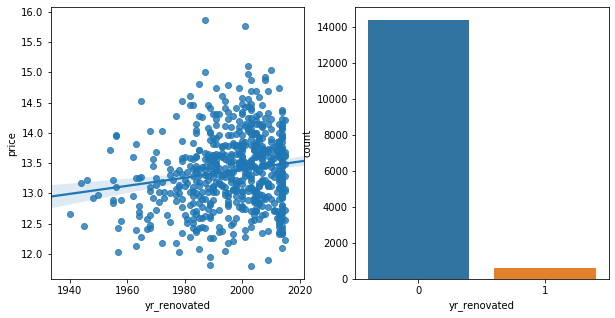

In [10]:
temp=data.loc[:,["yr_renovated","price"]]

plt.figure(figsize=(10,5))
plt.subplot(121)
sns.regplot(x="yr_renovated",y="price",data=temp[temp["yr_renovated"]>0])
print(temp[temp["yr_renovated"]>0].corr(method="spearman"))

temp.loc[temp["yr_renovated"]>0,"yr_renovated"]=1
plt.subplot(122)
sns.countplot(data=temp, x="yr_renovated")

plt.show()

재건축 한지 얼마 안된 집의 집가격이 높지 않을까 생각을 했으나 일단 재건축을 한집 자체가 너무 적었고, 재건축을 언제했느냐에 따라서 가격에 큰 영향을 줄지 궁금해서 왼쪽과 같이 그래프도 그리고 상관계수도 구했으나 스피어만 상관계수가 0.129로 낮은 상관관계를 보인다고 판단했다.

In [11]:
data.loc[data["yr_renovated"]>0,"yr_renovated"]=1
data["yr_renovated"].unique()

array([0, 1], dtype=int64)

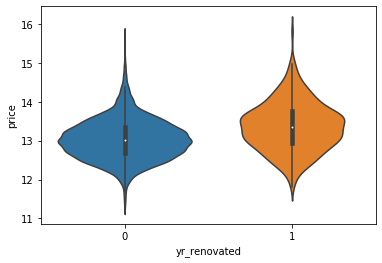

In [12]:
sns.violinplot(data=data, x="yr_renovated", y="price") 
plt.show()

연속형 변수였던 yr_renovated를 범주형 변수(재건축 1, 재건축 안함 0)로 바꿔서 바이올린플롯을 그려보니 재건축을 한 집이 조금 더 비싸게 팔리는 경향이 있음을 알수 있다..

### price와의 상관계수

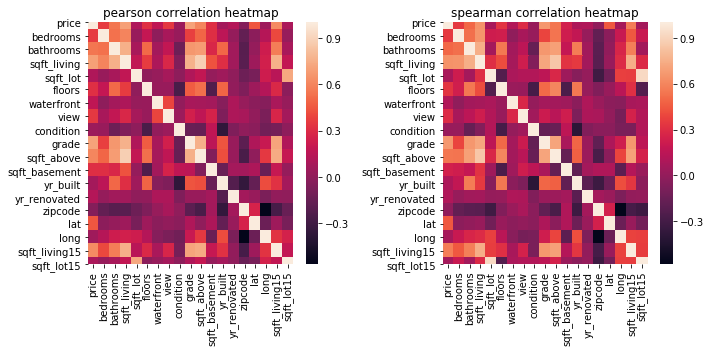

In [13]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
sns.heatmap(data.corr())#.sort_values(by="price",ascending=False))
plt.title("pearson correlation heatmap")

plt.subplot(1,2,2)
sns.heatmap(data.corr(method="spearman"))#.sort_values(by="price",ascending=False))
plt.title("spearman correlation heatmap")

plt.tight_layout()
plt.show()

In [14]:
data.corr().sort_values(by="price",ascending=False)["price"]

price            1.000000
grade            0.707412
sqft_living      0.697907
sqft_living15    0.621800
sqft_above       0.607197
bathrooms        0.552000
lat              0.444417
bedrooms         0.359946
view             0.347506
floors           0.317810
sqft_basement    0.314378
waterfront       0.172580
yr_renovated     0.127241
sqft_lot         0.108946
sqft_lot15       0.096976
yr_built         0.076293
long             0.054362
condition        0.042947
zipcode         -0.039195
Name: price, dtype: float64

- __grade와 sqft_living, sqft_living15, sqft_above__ 이렇게 네가지 변수들이 price와의 피어슨 상관계수가 0.6 이상이라서 강한 상관관계를 가진다는 것을 알수 있었다. 집가격은 자연현상이 아니라 사회현상 중 하나로 생각되어지기 때문에 상관계수 0.4 이상이면 상관관계가 없지 않다고 판단했다.   
강한 상관관계: grade와 sqft_living, sqft_living15, sqft_above   
약한상관관계: bathrooms, lat
- __grade와 sqft_living, sqft_living15, sqft_above__ 이렇게 네가지 변수들과 price의 pairplot을 그려보았다

<Figure size 144x144 with 0 Axes>

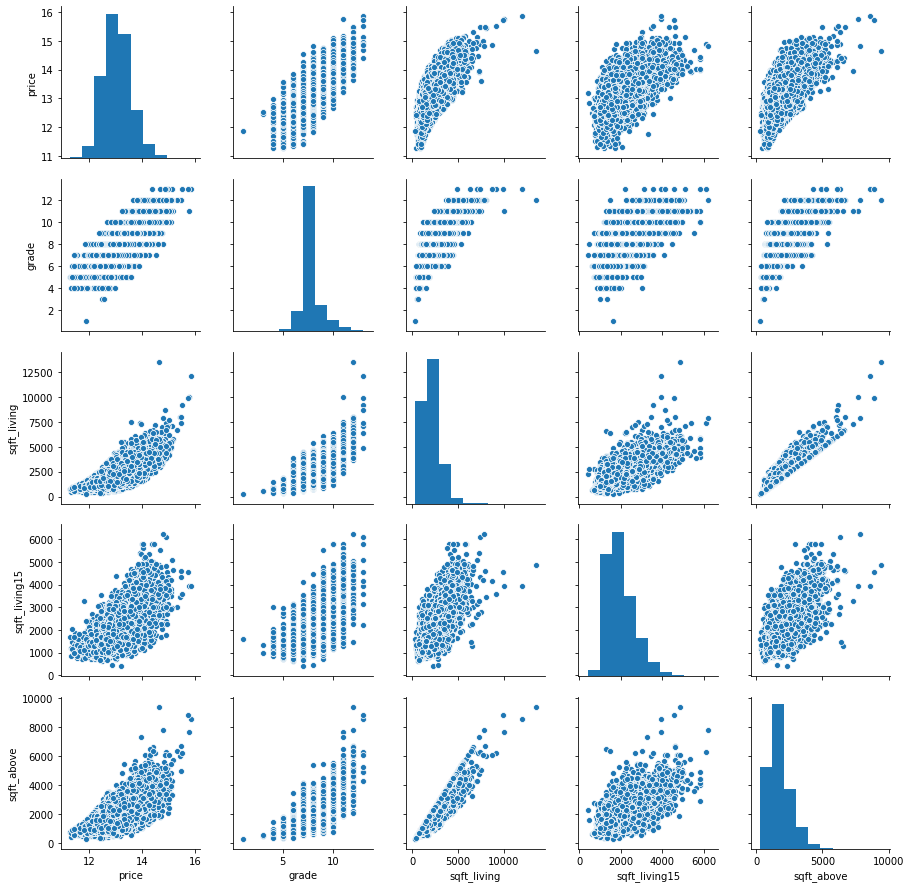

In [15]:
plt.figure(figsize=(2,2))
idx=data.corr().sort_values(by="price",ascending=False).index[:5].tolist()
sns.pairplot(data[idx])
plt.show()

- 직관적으로도 넓은 집이 좁은 집에 비해서 상대적으로 높은 가격일 것 같았는데 살고 있는 집의 넓이에 따라서 집가격도 함께 높아지는 것을 알수 있다. 


In [16]:
data["sqft_living"]=np.log1p(data["sqft_living"])
data["sqft_living15"]=np.log1p(data["sqft_living15"])
data["sqft_above"]=np.log1p(data["sqft_above"])

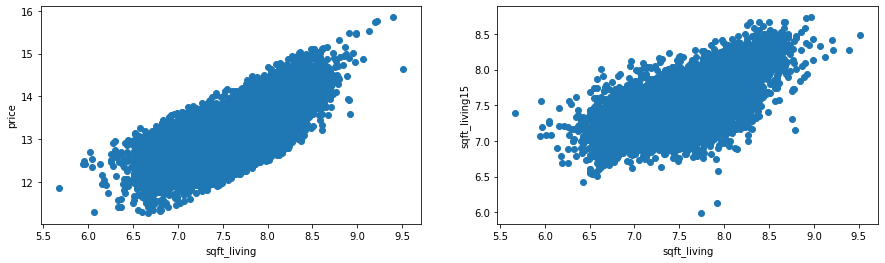

In [17]:
plt.figure(figsize=(15,4))

plt.subplot(121)
plt.scatter(data["sqft_living"],data["price"])
plt.xlabel("sqft_living")
plt.ylabel("price")

plt.subplot(122)
plt.scatter(data["sqft_living"], data["sqft_living15"])
plt.xlabel("sqft_living")
plt.ylabel("sqft_living15")
plt.show()

In [18]:
data.loc[data["sqft_living"]>9.5] 

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8912,20140505T000000,14.639686,7,8.0,9.513477,307752,3.0,0,4,3,12,9.149634,4130,1999,0,98053,47.6675,-121.986,8.48694,217800


아웃라이어 제거 주거공간은 큰데 가격이 너무 떨어지고, sqft_living15크기와 대비해도 sqft_living만 너무 크다. 

In [19]:
data=data.drop([8912])
data=data.reset_index(drop=True)

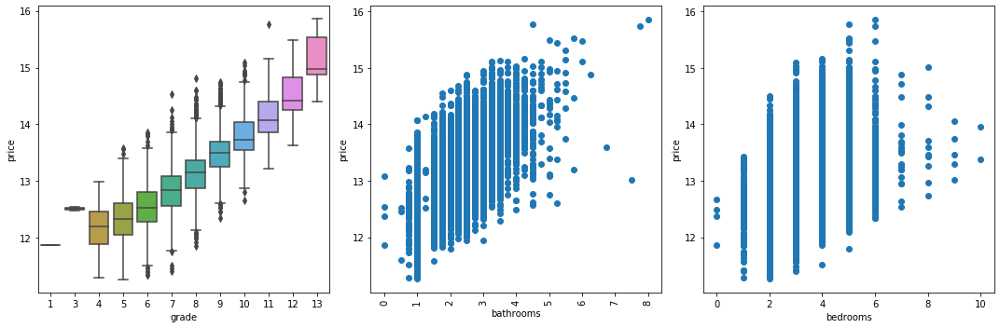

In [20]:
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
sns.boxplot(data=data, x="grade",y="price")

plt.subplot(1,3,2)
plt.scatter(data["bathrooms"],data["price"])
plt.xticks(rotation=90)
plt.xlabel("bathrooms")
plt.ylabel("price")

plt.subplot(1,3,3)
plt.scatter(data["bedrooms"],data["price"])
plt.xlabel("bedrooms")
plt.ylabel("price")


plt.tight_layout()

plt.show()

- grade에 따른 price 박스플롯을 그려본 결과 grade의 등급이 올라갈수록 높은 가격을 가지는 것을 알수 있었다. 순서형 변수로 지금처럼 1~13등급으로 두면 될것 같다.   
- bathroom역시 증가할수록 price가 증가하는 것을 볼수 있다.   
- bedrooms는 6개까지는 증가하지만 6개 이상으로 증가하는 경우는 가격이 증가하거나 그런 것은 없다. 즉, 침실이 6개 이상 증가한다고 유의미하게 집가격이 증가하는 것은 아닌 것으로 보인다. 차라리 7이상의 방들을 6이상으로 묶어버리는게 나을것 같다.

In [21]:
data.loc[data["bedrooms"]>=6,"bedrooms"]=6    # 7이상의 방들에 대해서는 6이상으로 함께 묶어버린다.

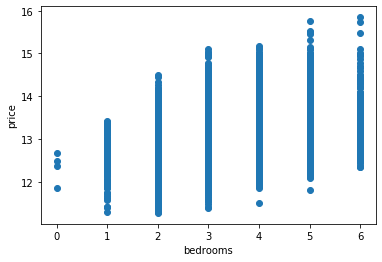

In [22]:
plt.scatter(data["bedrooms"],data["price"])
plt.xlabel("bedrooms")
plt.ylabel("price")
plt.show()

위와 같이 bedrooms가 7이상인 값들을 6으로 묶어서 bedrooms이 증가할수록 가격이 증가하는 순서가 있는 범주형변수로 생각하면 될것 같다. 


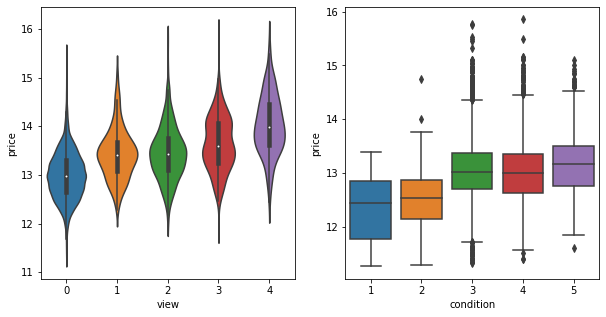

In [23]:
plt.figure(figsize=(10,5))
plt.subplot(121)
sns.violinplot(data=data, y="price", x="view")

plt.subplot(122)
sns.boxplot(data=data, y="price", x="condition")
plt.show()

설명변수 view와 condition은 순서가 있는 범주형 변수이다. view에 따라서 가격의 오르는 것을 알수 있다. 하지만 condition의 경우는 condition이 4인 바이올린 그래프가 3과 거의 비슷한 것 같다. 심지어 condition이 5인 경우는 가격이 더 떨어지는 경향을 보이는 것을 알수 있다. 그러므로 condition 변수는 3이후로는 구분이 크지 않는 것 같다. 3,4,5를 하나로 묶는 것이 더 나아보인다.

In [24]:
data.loc[data["condition"]>=3,"condition"]=3


-----------------------
## 날짜에 대한 EDA

In [25]:
data["date1"]=data["date"].map(lambda x: x.split("T")[0])  # ex) 20141013 년월일
data["date2"]=data["date"].map(lambda x: x.split("T")[1])  # ex) 00000000 시분초
data["date"]=data["date1"]

print(data.date2.unique()) ## 시분초가 담긴 date2에는 000000만 있으므로 컬럼 date2삭제한다.
del data["date2"], data["date1"]

['000000']


date 컬럼을 Timestamp 자료형으로 바꿔준다.

In [26]:
data["date"]=data["date"].map(lambda x: pd.Timestamp(year=int(x[:4]),month=int(x[4:6]),day=int(x[6:8])))

In [27]:
data["wday"]=data["date"].map(lambda x: x.day_name()) # 요일변수를 만들어준다.

### 판매된 요일에 따른 집가격

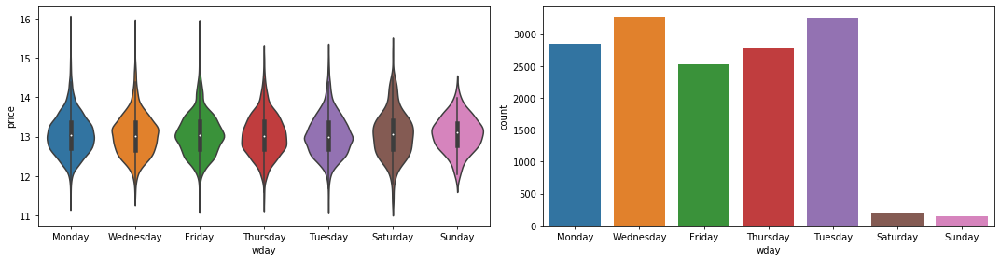

In [28]:
plt.figure(figsize=(15,4))
plt.subplot(1,2,1)
sns.violinplot(data=data, x="wday", y="price")

plt.subplot(1,2,2)
sns.countplot(data=data, x="wday")

plt.tight_layout()
plt.show()

- 오른쪽의 countplot을 통해서 대부분의 집 매매가 평일(월~금)에 이루어졌고 토요일과 일요일에는 총매매건수가 각각 500건이 안된다는 것을 알수 있다.
- 일요일을 제외하고 대체적으로 비슷한 가격대의 분포를 보이지만, 월,수,금에 다른 요일에 비해 상대적으로 비싼 금액의 집도 판매가 되는 것을 왼쪽의 바이올린 플롯을 통해 알수 있다. 
- 주말보다는 평일에 매매건수 자체가 많기 때문에 극단적으로 비싸거나 저렴한 집을 판매하게 될 가능성이 높다고 생각되어진다. 그러나 비슷하게 많이 판매되어지는 평일에서도 월수금은 화목보다 더 비싸거나 더 저렴한 집이 판매되는 일이 많은 것으로 보인다.
- 그래서 비슷한 분포를 보이는 월수금, 화목토 그리고 일요일을 하나로 묶어서 시각화를 해보았다.

In [29]:
temp=data[["wday","price"]]
temp.loc[(temp["wday"]=="Monday")|(temp["wday"]=="Wednesday")|(temp["wday"]=="Friday"),"wday"]=0
temp.loc[(temp["wday"]=="Thursday")|(temp["wday"]=="Tuesday")|(temp["wday"]=="Saturday"),"wday"]=1
temp.loc[(temp["wday"]=="Sunday"),"wday"]=2

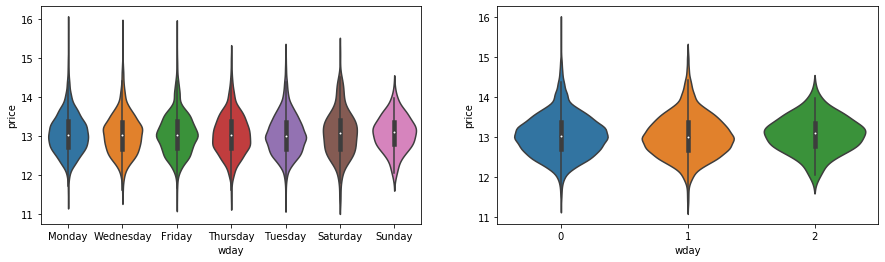

In [30]:
plt.figure(figsize=(15,4))
plt.subplot(1,2,1)
sns.violinplot(data=data, x="wday", y="price")

plt.subplot(1,2,2)
sns.violinplot(data=temp,x="wday",y="price")
plt.show()

0번은 월수금, 1번은 화목토, 그리고 일요일은 다른 극단적인 값이 매우 적은 정규분포이므로 비슷한 분포를 띄는 요일별로 묶어서 더미변수를 만들어도 괜찮겠다고 생각이 되어져서 이렇게 변수를 넣어보는 것을 시도해볼만하다고 생각했다.

## 지리적인 EDA

In [31]:
import folium

def get_points(df):
    return [(df["lat"][i],df["long"][i]) for i in range(df.shape[0])]

In [32]:
w=pd.get_dummies(data["wday"], drop_first=True,prefix="wday")
data=pd.concat([data,w], axis=1)
del data["wday"]

In [33]:
data["price"].mean() # 집가격의 평균

13.048016437549522

In [34]:
red_points=data.loc[data["price"]>data["price"].mean(),["lat","long"]] # 평균 집가격을 초과한 집들

In [35]:
blue_points=data.loc[data["price"]<=data["price"].mean(),["lat","long"]] # 평균 집가격 이하인 집들

In [36]:
red_points.head() # red_point와 blue_points에는 각각 평균가격을 초과한 집들과 평균 가격 이하인 집들의 위도와 경도가 들어있다

,lat,long
2,47.6168,-122.045
5,47.6007,-122.145
6,47.6900,-122.292
9,47.6700,-122.394
10,47.5714,-122.375


우리의 데이터에 적혀있는 집들은 모두 이 오랜지색 박스 안에 있다. 

평균 집가격을 초과하는 경우는 빨간색 점을 찍고 평균 집가격 미만일 경우는 파란색 점을 찍어보자 

In [37]:
from folium import Circle

mapping=folium.Map(location=[data["lat"].mean()-0.1,data["long"].mean()+0.3],
                  zoom_start=10)
folium.Rectangle(bounds=get_points(data), color='#ff7800').add_to(mapping)

for i,j in zip(red_points["lat"], red_points["long"]):
    Circle(radius=0.1,location=[i,j],color="red",fill=False,opacity=0.15).add_to(mapping)

for i,j in zip(blue_points["lat"], blue_points["long"]):
    Circle(radius=0.1,location=[i,j],color="blue",fill=False,opacity=0.15).add_to(mapping)

mapping

![](https://github.com/Asunny2019/AIFFEL_Exploration/blob/main/img/map.JPG?raw=true)
( 지도 위에 시각화를 하였으나 깃허브에서는 지도 시각화가 보이지 않아서 캡처이미지를 첨부)
- 데이터의 모든 집들은 주황색 박스 안에 포함이 된다. 
- log를 취한 price의 평균보다 낮은 집에는 파란색 점을 찍고, 평균보다 높은 집에는 빨간색 점을 찍었다. 

이 지도 시각화를 통해서 
1. 일단 북쪽(lat이 큰 쪽)의 집이 상대적으로 집값이 비싸다는 것을 알수 있다. price와 lat의 상관계수가 0.44였다는 점에서도 price와 lat의 상관관계가 있다고 볼수 있다.
2. 물가쪽의 그래프를 보면 빨간색의 점이 많이 찍혀있다. 특히 파란색 점이 많이 찍혀있는 Burien지역의 경우 물가 근처를 따라서 빨간색점이 빼곡히 찍혀있다. 같은 지역이라도 물가 근처의 집이 평균 이상의 집가격으로 판매가 되었다는 것을 알수 있다.
3. 그리고 집가격이 비싼곳과 저렴한 곳이 지역별로 나뉘어져 있다는 것을 알수가 있다.

아래의 박스플롯을 보아도 물가의 경우 집가격(price)이 전반적으로 높은 것을 알수 있다.

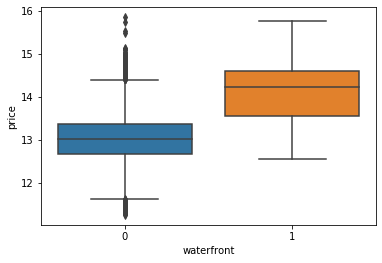

In [38]:
sns.boxplot(data=data, x="waterfront",y="price")
plt.show()

In [39]:
water_rate=float(data["waterfront"].sum()/data["waterfront"].shape[0])
print("전체데이터의waterfron의 비율:{0:.2f}% ".format(water_rate*100.0)) # 

전체데이터의waterfron의 비율:0.71% 


In [40]:
IQR=data["price"].quantile(0.75)-data["price"].quantile(0.25) # IQR= 제3분위수-제1분위수
outlier=data["price"].quantile(0.75)+(IQR*1.5)                # 집가격이 높은 이상치 제3분위수 + IQR*1.5

In [41]:
out=data[data["price"]>outlier] # 비싸게 팔린 집 (이상치) 198개 

In [42]:
water_rate=out["waterfront"].sum()/out["waterfront"].shape[0]  # 이상치 데이터의 waterfront의 비율
print("아웃라이어 데이터의waterfron의 비율:{0:.2f}% ".format(water_rate*100.0)) # 

아웃라이어 데이터의waterfron의 비율:21.32% 


앞의 박스플롯에서 waterfront가 1인경우 이상치가 없는 것을 보고 신기해서 전체데이터와  waterfront의 비율과 price가 아웃라이어인 데이터만 떼어내어서 waterfront의 비율을 각각 구해서 비교해보았다.  
- 전체 데이터에서 집앞에 강이 있는 비율은 0.71%이다.
- 집가격이 높은 이상치(outlier, 제3분위수+IQR * 1.5)의 waterfron비율은 21.21%에 달한다.
- 범주형 변수라서 price와 상관관계를 측정하는 것은 무의미하고 박스플롯을 그리고 가격대가 높은 집들의 비율이 유의미하게 높은 것으로 보아서 waterfront도 가격대를 판단하는 모델에 중요한 판단 기준이 될것 같다. 
- 일단 waterfront를 지금처럼 원핫인코딩으로 모델을 만들어보자. 아니면 waterfront인 데이터와 waterfront가 아닌 데이터를 나눠서 예측모델을 만드는 것을 시도해보아야겠다.

지도 시각화를 얻은 3번째 인사이트에 기인해서 생각을 하고 검색을 해서 다음과 같은 기사를 찾았다.  
[미국 우편번호의 비밀](https://www.joongang.co.kr/article/4783114#home)
- 같은 집코드(zipcode)에 거주하는 사람은 비슷한 환경이나 교육수준을 가진 경우가 많다. 연방센서스국이나 IRS같은 기관은 이런 특징을 이용해 집코드별 소득수준, 평균 연령, 최고 교육수준, 교통사고율 등의 통계를 낸다. 이 경우 집코드가 사회적 경제적 수준을 나타내는 지표로 사용된다.
90210은 캘리포니아의 대표적 부촌 베벌리힐스의 집코드다. 동시에 지난 5월 시즌2로 막을 내린 드라마의 이름이기도 하다. 90년대 인기 드라마 ‘베벌리힐스의 아이들’의 2000년도 판인 이 드라마는 집코드 90210에 사는 상류층 고등학생의 우정과 사랑을 그린다.

-즉, 우편번호 앞의 4자리는 같은 지역이라고 봐도 무리가 없는거 같다.

In [43]:
data["zipcode"]=data["zipcode"].map(lambda x: str(x)[:4])

In [44]:
print(data["zipcode"].nunique())
data["zipcode"].unique()

19


array(['9817', '9802', '9807', '9800', '9819', '9811', '9810', '9812',
       '9801', '9813', '9804', '9803', '9805', '9816', '9814', '9809',
       '9815', '9806', '9818'], dtype=object)

우편번호 앞자리4자리에 따라서 집가격의 분포가 제각각 차이가 나는 것을 알수있다. 우편번호에 대해서 one-hot-encoding을 해야겠다.

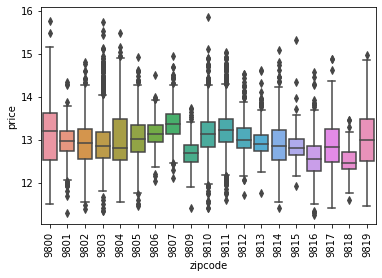

In [45]:
sns.boxplot(data=data, y="price",x="zipcode")
plt.xticks(rotation=90)
plt.show()

In [46]:
w=pd.get_dummies(data["zipcode"], prefix="zip",drop_first=True)
data=pd.concat([data,w],axis=1)
del data["zipcode"]

모델링부분을 다루기 이전에 Ensemble Learning이란 무엇인지 알아보자.[출처|introduction to ensemble learing](https://subinium.github.io/introduction-to-ensemble-1/#:~:text=%EC%95%99%EC%83%81%EB%B8%94(Ensemble)%20%ED%95%99%EC%8A%B5%EC%9D%80%20%EC%97%AC%EB%9F%AC,%EB%A5%BC%20%EA%B0%80%EC%A7%80%EA%B3%A0%20%EC%9D%B4%ED%95%B4%ED%95%98%EB%A9%B4%20%EC%A2%8B%EC%8A%B5%EB%8B%88%EB%8B%A4.)의 내용을 일부 요약했다.
- 앙상블 학습은 여러개의 학습 알고리즘을 사용하여 그 예측을 결합하여서 보다 정확한 예측에 도출하는 기법이다. 
- 아이디어: 하나의 강한 머신러닝 알고리즘보다 여러개의 약한 머신러닝 알고리즘이 낫다
- 단일 모델이 예측성능이 좋은 경우도 있지만, 앙상블 기법이 보다 유연한 모델을 만들어서 좋은 예측 결과를 기대할수 있다. 

가장 간단한 앙상블기법은  회귀문제의 경우는 Averaging으로 회귀를 하고, 분류 문제의 경우는 Voting을 사용하는 것이다. 그냥 평균을 내거나 투표를 해서 앙상블을 할수도 있고 평균을 내거나 투표를 할때 모델별로 가중치를 두어서 집계하는 방법이 있다.


In [47]:
data.columns

Index(['date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'wday_Monday', 'wday_Saturday',
       'wday_Sunday', 'wday_Thursday', 'wday_Tuesday', 'wday_Wednesday',
       'zip_9801', 'zip_9802', 'zip_9803', 'zip_9804', 'zip_9805', 'zip_9806',
       'zip_9807', 'zip_9809', 'zip_9810', 'zip_9811', 'zip_9812', 'zip_9813',
       'zip_9814', 'zip_9815', 'zip_9816', 'zip_9817', 'zip_9818', 'zip_9819'],
      dtype='object')

In [48]:
data.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,wday_Monday,...,wday_Tuesday,wday_Wednesday,zip_9801,zip_9802,zip_9803,zip_9804,zip_9805,zip_9806,zip_9807,zip_9809,zip_9810,zip_9811,zip_9812,zip_9813,zip_9814,zip_9815,zip_9816,zip_9817,zip_9818,zip_9819
0,2014-10-13,12.309987,3,1.00,7.074117,5650,1.0,0,0,3,7,7.074117,0,1955,0,47.5112,-122.257,7.201171,5650,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,2015-02-25,12.100718,2,1.00,6.647688,10000,1.0,0,0,3,6,6.647688,0,1933,0,47.7379,-122.233,7.908755,8062,0,...,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2015-02-18,13.142168,3,2.00,7.427144,8080,1.0,0,0,3,8,7.427144,0,1987,0,47.6168,-122.045,7.496097,7503,0,...,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,2014-06-27,12.458779,3,2.25,7.447751,6819,2.0,0,0,3,7,7.447751,0,1995,0,47.3097,-122.327,7.713785,6819,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2015-01-15,12.583999,3,1.50,6.966967,9711,1.0,0,0,3,7,6.966967,0,1963,0,47.4095,-122.315,7.409136,9711,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [49]:
del data["date"]
features=data[data.columns[1:]].values.copy() # 첫번째 컬럼 price 제외해서 설명변수 만든다.
target=data["price"].values.copy()            

In [50]:
data.columns


Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'wday_Monday', 'wday_Saturday',
       'wday_Sunday', 'wday_Thursday', 'wday_Tuesday', 'wday_Wednesday',
       'zip_9801', 'zip_9802', 'zip_9803', 'zip_9804', 'zip_9805', 'zip_9806',
       'zip_9807', 'zip_9809', 'zip_9810', 'zip_9811', 'zip_9812', 'zip_9813',
       'zip_9814', 'zip_9815', 'zip_9816', 'zip_9817', 'zip_9818', 'zip_9819'],
      dtype='object')

In [51]:
sub.loc[sub["yr_renovated"]>0,"yr_renovated"]=1
sub["yr_renovated"].unique()

sub.loc[data["bedrooms"]>=6,"bedrooms"]=6

sub.loc[sub["condition"]>=3,"condition"]=3

sub["sqft_living"]=np.log1p(sub["sqft_living"])
sub["sqft_living15"]=np.log1p(sub["sqft_living15"])
sub["sqft_above"]=np.log1p(sub["sqft_above"])

sub["date1"]=sub["date"].map(lambda x: x.split("T")[0])  # ex) 20141013 년월일
sub["date2"]=sub["date"].map(lambda x: x.split("T")[1])  # ex) 00000000 시분초
sub["date"]=sub["date1"]

print(sub.date2.unique()) ## 시분초가 담긴 date2에는 000000만 있으므로 컬럼 date2삭제한다.
del sub["date2"], sub["date1"]  

sub["date"]=sub["date"].map(lambda x: pd.Timestamp(year=int(x[:4]),month=int(x[4:6]),day=int(x[6:8])))

sub["wday"]=sub["date"].map(lambda x: x.day_name()) # 요일변수를 만들어준다.

#sub.loc[(sub["wday"]=="Monday")|(sub["wday"]=="Wednesday")|(sub["wday"]=="Friday"),"wday"]=0
#sub.loc[(sub["wday"]=="Thursday")|(sub["wday"]=="Tuesday")|(sub["wday"]=="Saturday"),"wday"]=1
#sub.loc[(sub["wday"]=="Sunday"),"wday"]=2

w=pd.get_dummies(sub["wday"], drop_first=True,prefix="wday")
sub=pd.concat([sub,w], axis=1)
del sub["wday"]

#sub["year"]=sub["date"].map(lambda x: x.year)
#sub["month"]=sub["date"].map(lambda x: x.month)


sub["zipcode"]=sub["zipcode"].map(lambda x: str(x)[:4])

w=pd.get_dummies(sub["zipcode"], prefix="zip",drop_first=True)
sub=pd.concat([sub,w],axis=1)
del sub["zipcode"], sub["date"]


['000000']


In [52]:
sub.columns

Index(['id', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'wday_Monday', 'wday_Saturday',
       'wday_Sunday', 'wday_Thursday', 'wday_Tuesday', 'wday_Wednesday',
       'zip_9801', 'zip_9802', 'zip_9803', 'zip_9804', 'zip_9805', 'zip_9806',
       'zip_9807', 'zip_9809', 'zip_9810', 'zip_9811', 'zip_9812', 'zip_9813',
       'zip_9814', 'zip_9815', 'zip_9816', 'zip_9817', 'zip_9818', 'zip_9819'],
      dtype='object')

### train, test 데이터셋 분리

In [53]:
X_train, X_test, y_train, y_test=train_test_split(features, target, shuffle=True, random_state=42, test_size=0.2)

In [54]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(12027, 41) (12027,)
(3007, 41) (3007,)


### 그리드 탐색(grid search) & 랜덤 탐색(random search)

- 하이퍼파라미터를 조합해보는 방법
- 그리드 탐색: 탐색할 하이퍼파라미터를 사람이 지정해두면 그 조합을 모두 시도하는 것이 그리드 탐색이다. 하이퍼 파라미터 공간이 제한적이라서 최적의 조합을 놓칠 가능성이 있다.

- 랜덤 탐색: 탐색할 하이퍼파라미터의 공간을 지정해두면 랜덤으로 탐색하기 때문에 그리드 서치에 비해서 최적의 조합을 찾을 가능성이 더 나음. 그렇다고 반드시 최적을 찾는 것은 아님.

### 1. RandomForest Regression 수행
- 일단 돌려봤다.

In [55]:
def RMSE(y_test, y_pred):
    return np.sqrt(np.mean((np.expm1(y_test)-np.expm1(y_pred))**2))


In [56]:
from sklearn.ensemble import RandomForestRegressor
rf_regr = RandomForestRegressor(n_estimators=600, criterion='squared_error',max_features=6, n_jobs=6, random_state=0)
# n_jobs: cpu 병렬처리, 랜덤포레스트는 n_estimators(트리 개수), 
# max_features 의사결정트리의 브런치를 하나 만들때 뽑는 feature개수

rf_regr.fit(X_train,y_train)


RandomForestRegressor(max_features=6, n_estimators=600, n_jobs=6,
                      random_state=0)

In [57]:

rf_pred = rf_regr.predict(X_test)

## 현재 에러를 측정하려면 정답 y_test과 예측값 rf_pred에 
print(RMSE(y_test, rf_pred))

132049.1363082187


GridsearchCV를 이용해서 n_estimators와 max_features를 튜닝

In [58]:
param_grid = {'n_estimators':[600,800], # 트리 개수
             'max_features':[15,20]}  # 트리의 브런치를 하나 만들때 설명변수를 몇개 뽑을까?

from sklearn.model_selection import GridSearchCV # CV는 cross validation의 약자 / 중요한 문법

grid_search = GridSearchCV(rf_regr,param_grid,cv=5,scoring='neg_root_mean_squared_error')  
#grid_search에서 성능이 좋다고 판단하는 건 크기가 크면 클수록 성능이 좋다고 판단하므로 neg_root_mean_squared_error
#estimator쓰고, 튜닝할 값 쓰고 cv는 보통 5, scoring은 뭘 기준으로하냐

grid_search.fit(X_train,y_train)
grid_search.best_params_
grid_search.best_score_


-0.17810175335465034

In [59]:
print(grid_search.best_params_)
print(grid_search.best_score_)

{'max_features': 20, 'n_estimators': 800}
-0.17810175335465034


5-fold cross validation을 하여서 randomforest의 regression을 진행했다. max_features는 20, n_estimators는 800에서 가장 좋은 성능이 나왔다.

In [60]:
rf_regr = RandomForestRegressor(n_estimators=800, criterion='squared_error',max_features=6, n_jobs=20, random_state=0)

rf_regr.fit(X_train,y_train)
rf_pred = rf_regr.predict(X_test)

print(RMSE(y_test, rf_pred))

132088.76073503616


그러나 성능이 11000과는 너무 거리가 멀었다. 다른 모델에 대해서 시도를 해볼필요가 있었다.

### 2. lightgbm 실행

In [61]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from lightgbm import LGBMRegressor


왜 grid SearchCV에서 'neg_mean_squared_error'를 썼을까?
- 사이킷런의 교차검증기능은 scoring 매개변수에 (낮을수록 좋은) 비용함수가 아니라 (클수록 좋은) 효용 함수를 기대합니다. 그래서 평균 제곱오차(mse)의 반댓값(즉, 음숫값)을 계산하는 neg_mean_squared_error함수를 사용합니다. [핸즈온 머신러닝]
- 사이킷런 페이지에서는 각 점수(scoring)를 classification, clustering, regression로 분류한다 문제에 맞는 scoring을 사용하면 된다.
- 그리드 탐색을 하기 전에

In [62]:
def my_GridSearch(model, train, y, param_grid, verbose=2, n_jobs=5):
    # GridSearchCV 모델로 초기화
    grid_model = GridSearchCV(model, param_grid=param_grid, scoring='neg_mean_squared_error', \
                              cv=5, verbose=verbose, n_jobs=n_jobs)
    
    # 모델 fitting
    grid_model.fit(train, y)

    # 결과값 저장
    params = grid_model.cv_results_['params']
    score = grid_model.cv_results_['mean_test_score']
    
    # 데이터 프레임 생성
    results = pd.DataFrame(params)
    results['score'] = score
    
    # RMSLE 값 계산 후 정렬
    results['RMSLE'] = np.sqrt(-1 * results['score'])
    results = results.sort_values('RMSLE')

    return results


In [63]:
random_state=2020
param_grid = {
    'n_estimators': [50, 100,500,1000],
    'max_depth': [1, 10],
    "learning_rate":[0.1,0.01,0.001]
}

model = LGBMRegressor(random_state=random_state)
my_GridSearch(model, X_train, y_train, param_grid, verbose=2, n_jobs=5)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


,learning_rate,max_depth,n_estimators,score,RMSLE
15,0.010,10,1000,-0.028544,0.168950
5,0.100,10,100,-0.028961,0.170180
6,0.100,10,500,-0.029186,0.170840
7,0.100,10,1000,-0.029821,0.172686
14,0.010,10,500,-0.030110,0.173522
4,0.100,10,50,-0.030373,0.174277
3,0.100,1,1000,-0.039286,0.198207
2,0.100,1,500,-0.040800,0.201991
1,0.100,1,100,-0.055001,0.234522
11,0.010,1,1000,-0.055683,0.235972


 totalling 120 fits이 나온 이유는 지금 학습시킬 모델 LGBMRegressor에 n_estimators를 50,100, 500,1000(4가지) 을 max_depth 1,10, (2가지)learning_rate를 0.1, 0.01,0.001(3가지)을 시도하고 5- fold cross validation(5번씩)을 진행하기 때문에 총 120(4 * 2 * 3 * 5=120)번 피팅을 한다는 뜻이다.  
 LightGBM Regressor를 grid search 시켜본 결과 learning rate 0.01에, max depth 10, n_estimators 1000이 가장 작은 RMSLE 스코어가 나왔다. 이젠 이 값으로 fitting을 해보자

In [64]:
model = LGBMRegressor(max_depth=10, n_estimators=1000, learning_rate=0.01,random_state=random_state)
model.fit(X_train, y_train)
prediction = model.predict(X_test)
prediction

array([12.46917005, 13.80439503, 13.28768049, ..., 12.64778071,
       13.12144963, 12.96519899])

In [65]:
print(RMSE(y_test, prediction))

110634.7590219728


In [66]:
col=sub.columns[1:].tolist()

In [67]:
X_train.shape

(12027, 41)

In [68]:
sub.shape

(6468, 42)

In [69]:
model = LGBMRegressor(max_depth=10, n_estimators=500, learning_rate=0.1,random_state=random_state)
model.fit(X_train, y_train)

pred=model.predict(sub[col].values)

submission 제출할 코드 만들기

In [70]:
submission = pd.read_csv(r'.\data\sample_submission.csv')
submission.head()

,id,price
0,15035,100000
1,15036,100000
2,15037,100000
3,15038,100000
4,15039,100000


In [71]:
submission['price'] = np.expm1(pred)
submission.head()

,id,price
0,15035,4.870517e+05
1,15036,4.653252e+05
2,15037,1.360080e+06
3,15038,2.697778e+05
4,15039,3.251745e+05


In [73]:
submission.to_csv('submission.csv', index=False)


![](https://github.com/Asunny2019/AIFFEL_Exploration/blob/main/img/kaggle_1.JPG?raw=true)

## 회고

- public score를 __120140.31249-> 121545.66259 -> 118259.89941 -> 115691.48868__ 순서로 줄여갔다.
- __public score - 120140.31249__ 는 ex05를 따라가면서 실습으로 업로드했던 점수였다. 
- __public score - 121545.66259:__  맨 처음에는 EDA를 하면서 영감이 떠오르는대로 요일별로 바이올린 그래프를 그려서 분포가 비슷한 것들끼리 묶어보기도 하고 년도와 월 변수도 넣어서 모델을 돌려보고, 지도그래프도 그려서 강가의 집이 비싸다는 것도 추측해보고, 비싼집들은 비싼집들끼리 모이겠구나 싶어서 미국의 우편번호 체계도 찾아보았다.  신나게 이것저것 더미변수를 추가해서 모델을 돌렸는데 오히러 실습때보다도 성적이 떨어진 것을 발견하고 깜짝 놀랐다. 전처리를 EDA하지 않았을 때보다 성적이 떨어진 것을 보고 놀라서 내가 추측으로 넣었던 변수들을 제거했다.  일례로 요일별 바이올린 그래프를 그렸을때 그래프의 분포가 비슷한 요일들끼리 묶어서 (월수금, 화목토, 일) 원핫인코딩을 하였다. 이 추측이 잘못되었을 수 있겠다는 생각에 그냥 요일변수로 바꾸었다.  date에서 뽑아낸 year, month 설명변수도 영향이 있지 않을까 생각해서 관습적으로 넣었던 변수들을 제거하였다.
- __public score - 118259:__ __관습적으로 혹은 추측으로 넣었던 변수들을 제거하니까 public score가 118259로 떨어졌다.__  원핫인코딩을 지나치게 많이 만들면 __오버피팅이 발생할 위험__ 이 있으니까 꼼꼼히 따져보고 넣으라는 소리가 이런 말이라는 것을 알게되었다. 이렇게 스코어가 올라가니까 조금 더 욕심이 생겨서 내가 좀 더 세세하게 보지 않았던 변수가 뭐가 있는지 체크해보았다. 이때 EDA를 했던 변수가 condition과 view 변수였다. 두 개의 변수는 __순위가 있는 범주형 변수__ 로 점수를 매겨서 넣은 값이었다. 
- view값은 올라갈수록 price가 함께 올라가서 설명변수로 쓰기에 타당하다고 생각이 되어졌다. 그러나 condition변수는 3까지는 condition이 증가하면서 price도 함께 증가하는데 4이후로는 비슷하거나 오히려 price의 분포가 감소하는 경향을 보였다. 그래서 3이상의 변수에 대해서 모두 3으로 바꾸어주었다.이후 __115691.48868 로 score가 줄어들었다.
- 비록 루브릭의 3번째 기준인 110000 이하로 줄이지는 못했지만 잠시나마 캐글에서 점수를 줄여나가는 재미와 feature engineering에 대한 맛보기를 한 것 같아서 즐거웠다. 

- EDA를 하는 과정이 생각보다 오래 걸렸다. 마지막에 가서야 부랴부랴 모델을 돌려서 좀 더 다양한 모델을 돌리거나 하이퍼 파라미터를 테스트해보지 못한게 아쉽다. 이렇게 일주일이라는 제한된 시간에 데이터를 분석하고 모델링을 해야하는 경우 시간을 어떻게 분배해야 할 것인지에 대해서 생각해보게 되는 계기였다. 

- EDA는 기본적인 것들에 대해서 하고 일단 모델을 빨리 돌려보는게 필요하지 않았을까 생각해보았다. EDA를 하다보니 어떻게하면 예쁘게 구성할까에 몰입하게 되었는데 모델을 돌리고 EDA를 다시 진행하다보니까 "내가 데이터에서 못 발견한게 무엇이지?"라는 생각이 들면서 데이터의 인사이트 자체에 집중하게 되었던 것 같다. 앞으로 작업을 함에 있어서 시간분배를 어떻게 적절히해서 시간내에 가급적이면 다양한 시도를 하고 후회없이 결과물을 만들어내는 습관을 가져야겠다는 생각이 들었다.
